# Flickr Image Captioning with TF2 & TPU!!!
***with bonus improvement on using Glove***

Image Captioning is a very exciting problem where our model have to translate understanding of images to human readable sentences! However, although Kaggle has been a very rich source of shared codes, I found that there's extremely rare Kaggle kernels on this exciting domain where Vision meets NLP ... 


![Image Captioning](https://miro.medium.com/max/1400/1*6BFOIdSHlk24Z3DFEakvnQ.png)

When I started learning Deep Learning and exploring Kaggle, this kind of tutorial kernel is the one I was looking for, but could not find practical resources at that time. I hope this tutorial to be a starting point and inspiration for those who want to learn this exciting field of Visio-Linguistic domain!!

With the release of Tensorflow 2 (the latest version now is TF2.2) and Kaggle free TPU + free GCS (Google Cloud Storage), we all now can access a computational **super power** easily than ever before. I think this is simply a revolution, and this super-feature finally allow laymen like us to attack complicated problems like Image Captioning to another level. All of these inspired me to work and share this tutorial kernel!


## Reference and Improvement
At the moment when I was writing this kernel, the best source to learn image captioning is TF official tutorial : https://www.tensorflow.org/tutorials/text/image_captioning where not only we can learn how to do basic image captioning, we can also learn how to 

* How to implement **Attention mechanism** properly! Attention mechanism is a technique to allow us to focus on only-relevant spatial image features when generating each word.
* How to construct **Keras subclass API** in contrast to normally usage of Function API
* How to build **custom training loop** in Keras

To adapt this great tutorial to Kaggle we need to adjust code a bit. For those who are interested in to try this original tutorial in Kaggle, I already did all the jobs for you here : https://www.kaggle.com/ratthachat/image-captioning-by-effnet-attention-in-tf2-1

In this kernel, we will go beyond the original tutorial in many directions!!

* ***From GPU to TPU*** : we will increase our computational power by *** > 10 folds*** using Kaggle recent TPU feature! With Tensorflow 2, this requires minimal code changing and requires us to transfer data to GCS, which again Kaggle has generously provided us for free! 
* ***Complexity of data***: we changes training data from COCO to Flickr which is more challenging due to quality of texts describing the images! To get decent model, we increase training data ***almost 20 folds*** from around 8K to 150K from the original tutorial, but all training from scratch to convergence can be done by less than 2 hours with the power of TF2 and TPU!!
* ***Capability of models*** : we upgrade both CNN encoder (for images) and RNN decoder (for texts). On CNN, we use the current SOTA EfficientNet with "Noisy-Students" weights generously provided [here](https://github.com/qubvel/efficientnet) . For RNN, instead of learning word vectors from scratch, we adjusted the code to embed the pretrained Glove vectors directly . 

With all these upgrades we got much better results than the original tutorial. (you can compared this kernel result with the original in Kaggle's link above)

# 0. Outline and Pre-requisite
This tutorial consists of 3 main sections

1. Setup everything (TPU/GPU and input pipeline)
2. Build and train Model
3. Predict and visualize image captions

Each section consists of several sub-steps as described in each section . Before we can begin, install the latest tensorflow stable version (TF 2.2) and Qubvel's efficientnet . These two may be auto set up into Kaggle docker in the future, but for now we have to install it manually.

In [1]:
## Try efficientnet in addition to InceptionV3 of the original example.
!pip install -q tensorflow==2.2 # fix TPU memory issue
!pip install -q efficientnet

N_VOCABS = 20000 # all vocabs of flickr30k is around 18k, so we choose them all -- if training loss does not work well, change to 5K


You should consider upgrading via the '/opt/conda/bin/python3.7 -m pip install --upgrade pip' command.
You should consider upgrading via the '/opt/conda/bin/python3.7 -m pip install --upgrade pip' command.


> I also provide the saved weights for this kernel, if you just want to play around image captioning, without model training, you can set the `USE_PREVIOUS_SAVE = True` . If you set it to be `False`, please remember to turn on your TPU where you have a 30 hours/week quota.

**NOTE** In notebook version 7, I set this to true, and just use CPU to predict captions. If you want to use a TPU to train this kernel, please see version 6.

In [2]:
USE_PREVIOUS_SAVE = True# Set to False if you want to train the model by yourself

# 1. Setup evertything

We have to prepare several steps of data pipeline. Note that we have two types of inputs : images and real-captions, and only one output type (predicted captions)

1.1. Choose appropriate TF `strategy` for TPU/GPU, and Transfer dataset into Kaggle GCS in case of TPU

1.2. Propcess Captions , adding `<start>` and `<end>`

1.3. Build a list of images and corresponding captions (image-input and text-output)

1.4. Setup text-input for RNN decoder

 - 1.4.1) Load pretrained word vectors (Glove) for each vocabulary
 - 1.4.2) Tokenize captioning to model's vocabulary also pad each caption to have the same length
 
1.5. Split data into train and valid set

1.6. Employ `tf.dataset` to construct appropriate input pipeline using data from steps 2.-4.
 - We can also add data transformation (e.g. image augmentation like H-flip) easily in this step

In [3]:
import tensorflow as tf

# You'll generate plots of attention in order to see which parts of an image
# our model focuses on during captioning
import matplotlib.pyplot as plt

# Scikit-learn includes many helpful utilities
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle

import re
import numpy as np
import os
import time
import json
import gc
from glob import glob
from PIL import Image
import pickle
import pandas as pd

## 1.1 TPU/GPU strategy and GCS transfer

In [4]:
from kaggle_datasets import KaggleDatasets
import efficientnet.tfkeras as efn 
from tokenizers import ByteLevelBPETokenizer

The following code will detect TPU or else use either GPU or CPU. With TF-Keras' power, all complex details of multi-GPUs or TPUs will hide under the hood in the variable `strategy` . In Kaggle, if you enable TPU, you should see REPLICAS = 8 (meaning 8 processors for TPU v3-8)

In [5]:
try:
    # TPU detection. No parameters necessary if TPU_NAME environment variable is
    # set: this is always the case on Kaggle.
    tpu = tf.distribute.cluster_resolver.TPUClusterResolver()
    print('Running on TPU ', tpu.master())
except ValueError:
    tpu = None

if tpu:
    tf.config.experimental_connect_to_cluster(tpu)
    tf.tpu.experimental.initialize_tpu_system(tpu)
    strategy = tf.distribute.experimental.TPUStrategy(tpu)
else:
    # Default distribution strategy in Tensorflow. Works on CPU and single GPU.
    strategy = tf.distribute.get_strategy()

print("REPLICAS: ", strategy.num_replicas_in_sync)

REPLICAS:  1


### Upload Flickr into Kaggle GCS

We will use the [Flickr dataset](http://bryanplummer.com/Flickr30kEntities/) to train our model. Originally, the dataset contains more than 30,000 images, each of which has at least 5 different caption annotations. This great dataset is already in Kaggle's dataset; however, if we want to train our model using TPU, we have to upload this dataset into Kaggle GCS so that TPU can be most effectively access them. Note that TPU cannot directly access normal Kaggle dataset, so this step is a must.

Kaggle is so great that it provides free GCS for us, and easy API, see KaggleDatasets below. This will automatically select the best GCS zone with free of charges!

In [6]:
LOCAL_FLICKR_PATH = '/kaggle/input/flickr-image-dataset/flickr30k_images/'
annotation_file = LOCAL_FLICKR_PATH + 'results.csv'
LOCAL_IMG_PATH = LOCAL_FLICKR_PATH + 'flickr30k_images/'

!ls {LOCAL_IMG_PATH} | wc

  31785   31785  468996


**IMPORTANT: **. The following cell upload all Flickr images (8GB) into GCS . And it will take around 25 minutes!!!

The below cell will show an error (HTTP timeout), but actually the transferring process is still ongoing. If using TPU, you have to run this cell again by 25 minutes of time, until it returns the message "yeah" . At this point, you can turn off your TPU, wait, and come back again in 25-30 minutes until you can move on.

If you use GPU or CPU with option `USE_PREVIOUS_SAVE = True`, you can pass all these cells without problems, since you can access normal Kaggle dataset.

Also note that once the upload finish, it sometimes will remain in Kaggle GCS for a while; therefore, maybe if you play around this kernel in 2-3 days consecutively, you may see that you don't have to upload them again.


In [7]:
%%time
## This steps will take around 25 minutes offline ...
if strategy.num_replicas_in_sync == 8:
#     GCS_DS_PATH_FLICKR = KaggleDatasets().get_gcs_path('flickr8k-sau') # 2gb # 5 mins
    GCS_DS_PATH = KaggleDatasets().get_gcs_path('flickr-image-dataset') # 8gb # 20-25 mins
    print('yeah')

CPU times: user 29 µs, sys: 0 ns, total: 29 µs
Wall time: 34.1 µs


In [8]:
## Once the uploading finish, set up the correct paths for each GPU/TPU

if strategy.num_replicas_in_sync == 8:
    # print(GCS_DS_PATH_FLICKR)
    # !gsutil ls $GCS_DS_PATH_FLICKR

    print(GCS_DS_PATH)
    !gsutil ls $GCS_DS_PATH
    
    FLICKR_PATH = GCS_DS_PATH + '/flickr30k_images/'
    IMG_PATH = FLICKR_PATH + 'flickr30k_images/'
    # less than 10sec
    !gsutil ls {IMG_PATH} | wc
else: 
    FLICKR_PATH = LOCAL_FLICKR_PATH
    IMG_PATH = LOCAL_IMG_PATH

## 1.2 Processing Captions
After finish preparing data, now we begin to process the captions for all images. First, we add the tag `<start>` and `<end>` to all captions to tell the model about the beginning and the end of each caption.

In [9]:
df = pd.read_csv(annotation_file, delimiter='|') #
print(df.shape)
print(df.columns[2], df.columns[2] == ' comment') # The column name has the front space
df[' comment'].values[0]
df.head(6)

(158915, 3)
 comment True


,image_name,comment_number,comment
0,1000092795.jpg,0,Two young guys with shaggy hair look at their...
1,1000092795.jpg,1,"Two young , White males are outside near many..."
2,1000092795.jpg,2,Two men in green shirts are standing in a yard .
3,1000092795.jpg,3,A man in a blue shirt standing in a garden .
4,1000092795.jpg,4,Two friends enjoy time spent together .
5,10002456.jpg,0,Several men in hard hats are operating a gian...


In [10]:
from tqdm import tqdm, tqdm_notebook
tqdm.pandas()
START_TOKEN = '<start> '
END_TOKEN = ' <end>'

# tokenizer = ByteLevelBPETokenizer(lowercase=True)
# tokenizer

/opt/conda/lib/python3.7/site-packages/tqdm/std.py:666: FutureWarning: The Panel class is removed from pandas. Accessing it from the top-level namespace will also be removed in the next version
  from pandas import Panel


In [11]:
def add_start_end(text):
    return START_TOKEN + str(text) + END_TOKEN

df['comment'] = df[' comment'].progress_apply(add_start_end)
df.comment.values[:6]

100%|██████████| 158915/158915 [00:00<00:00, 361427.75it/s]


array(['<start>  Two young guys with shaggy hair look at their hands while hanging out in the yard . <end>',
       '<start>  Two young , White males are outside near many bushes . <end>',
       '<start>  Two men in green shirts are standing in a yard . <end>',
       '<start>  A man in a blue shirt standing in a garden . <end>',
       '<start>  Two friends enjoy time spent together . <end>',
       '<start>  Several men in hard hats are operating a giant pulley system . <end>'],
      dtype=object)

## 1.3 Lists of input images and corresponding captions

Next, we begin to prepare data pipeline. Lets start first by building a list of input images and corresponding captions (image-input and text-output)

Note that since each image have 5 captions, we simply have 5 duplicated image names in the `full_img_name_list`

In [12]:
full_img_name_list = [] # include gs path

for ii in tqdm_notebook(range(len(df))):
    full_image_path = IMG_PATH + df.image_name.values[ii]
    full_img_name_list.append(full_image_path)
                        
len(full_img_name_list), full_img_name_list[:10]

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  This is separate from the ipykernel package so we can avoid doing imports until


(158915,
 ['/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/1000092795.jpg',
  '/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/1000092795.jpg',
  '/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/1000092795.jpg',
  '/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/1000092795.jpg',
  '/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/1000092795.jpg',
  '/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/10002456.jpg',
  '/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/10002456.jpg',
  '/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/10002456.jpg',
  '/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/10002456.jpg',
  '/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/10002456.jpg'])

In [13]:
all_captions_list = list(df.comment.values)
print(len(all_captions_list), all_captions_list[:5])

158915 ['<start>  Two young guys with shaggy hair look at their hands while hanging out in the yard . <end>', '<start>  Two young , White males are outside near many bushes . <end>', '<start>  Two men in green shirts are standing in a yard . <end>', '<start>  A man in a blue shirt standing in a garden . <end>', '<start>  Two friends enjoy time spent together . <end>']


In [14]:
import gc
gc.collect()

99

## 1.4 Setup text-input for RNN decoder (text-input)

Here, we have to tokenize the caption labels so that our RNN can use as input and predict as output (word by word). 

In order to generate good sentence, one key is to have good word vectors, so here we choose to employ the pretrained Glove vectors to improve our captioning process

### 1.4.1 Setup Glove word vectors

the below function `build_matrix` will return the required word vectors. This function will recieve list of words in the dataset's vocabulary as input. We will tokenize all captions and list all vocabs in the dataset in steps 1.4.2

This funciton is carefully designed to return meaningful word vectors as best as it could as it can fix many unknown words like two examples below :

**Example1.** Note that as Gloves differentiate between upper and lower cases, sometimes Glove may not know word like `john` but it may know `John`. In this case if our dataset have the word `john` which can happen in informal writing, we still want it to have the `John`'s vector (instead of having a random one due to out-of-vocabulary) 

**Example2.** For another case, sometimes our dataset may contain some uncommon words like `deforestization` but Glove will not know this word. However, as this complex word may come from the root like `deforest` where Glove really knows, so it may be better to give `deforest`'s vector to this complex word instead of a pure random one.

Both examples are done automatically in the `build_matrix` function with this line : 
`for candidate in [word, word.lower(), word.upper(), word.capitalize(), ps.stem(word), lc.stem(word), sb.stem(word) ]:` .

Note that all these sub-words mapping can be done automatically in modern decoder model like GPT-2. However, at this moment, GPT-2 cannot get the image input vectors, so unfortunately we cannot employ the GPT-2 super power into our captioning model.

In [15]:
from nltk.stem import PorterStemmer
ps = PorterStemmer()
from nltk.stem.lancaster import LancasterStemmer
lc = LancasterStemmer()
from nltk.stem import SnowballStemmer
sb = SnowballStemmer("english")

from gensim.models import KeyedVectors
import gensim
def build_matrix(word_index, embedding_index, vec_dim):
    
    num_unk = 0
    
    emb_mean, emb_std = -0.0033470048, 0.109855264
    embedding_matrix = np.random.normal(emb_mean, emb_std, (len(word_index) + 1,vec_dim))
#     embedding_matrix = np.zeros((len(word_index) + 1, vec_dim))
    for word, i in word_index.items():
        known = False
        for candidate in [word, word.lower(), word.upper(), word.capitalize(), 
                          ps.stem(word), lc.stem(word), sb.stem(word) ]:
            if candidate in embedding_index:
                embedding_matrix[i] = embedding_index[candidate]
                known = True
                break
        if known == False: num_unk += 1
    
    print('number of unknown words is ', num_unk)
    return embedding_matrix

In [16]:
%%time
# we actually have two choices of pretrained word vectors here : glove and word2vec. You are free to experiment what's best.
EMBEDDING_FILES = [
    '../input/gensim-embeddings-dataset/crawl-300d-2M.gensim',
    '../input/gensim-embeddings-dataset/glove.840B.300d.gensim'
]

glove_model = gensim.models.KeyedVectors.load(EMBEDDING_FILES[1], mmap='r') # here, we choose glove
gensim_words = glove_model.index2word
print(len(gensim_words), gensim_words[:20])
# How to use
print(glove_model['the'].shape)
'the' in glove_model

2196016 [',', '.', 'the', 'and', 'to', 'of', 'a', 'in', '"', ':', 'is', 'for', 'I', ')', '(', 'that', '-', 'on', 'you', 'with']
(300,)
CPU times: user 7.72 s, sys: 1.06 s, total: 8.78 s
Wall time: 8.81 s


True

### 1.4.2 Tokenization
Here, we do a usual keras text-processing : 

- tokenize all captions into list of words, and remember all vocabulary
- convert list of words into list of "word-index"
- pad each example in the list to have the same length

Note that we can set the number of Vocab to be small to simplify the training process; however, in this kernel, we already employed pretrained word vector power, so we choose the full set of vocab (around 20K words) so that we can produce most natural sentences.

In [17]:
# Find the maximum length of any caption in our dataset
def calc_max_length(tensor):
    return max(len(t) for t in tensor)

In [18]:
%%time
# Choose the top_k words from the vocabulary
top_k = N_VOCABS 
tokenizer = tf.keras.preprocessing.text.Tokenizer(num_words=top_k,
                                                  oov_token="<unk>",
                                                  filters='!"#$%&()*+.,-/:;=?@[\]^_`{|}~ ') # note 'a'
tokenizer.fit_on_texts(all_captions_list)
train_seqs = tokenizer.texts_to_sequences(all_captions_list)

tokenizer.word_index['<pad>'] = 0
tokenizer.index_word[0] = '<pad>'

CPU times: user 8.31 s, sys: 0 ns, total: 8.31 s
Wall time: 8.31 s


In [19]:
# make list from dict
tokenizer.index2word = [tokenizer.index_word[ii] for ii in range(len(tokenizer.word_index)) ] 
print(tokenizer.index2word[:20]) # see top-20 most frequent words
print(tokenizer.index2word[-20:]) # these all come to <unk>
len(tokenizer.index2word)

['<pad>', '<unk>', 'a', '<start>', '<end>', 'in', 'the', 'on', 'and', 'man', 'is', 'of', 'with', 'woman', 'two', 'are', 'to', 'people', 'at', 'an']
['seam', 'coupling', 'welded', 'pinball', 'keffiyahs', 'religiously', 'richly', 'realize', 'swatting', 'alb', 'containig', 'torah', 'bees', 'bagpiper', 'polls', 'spaniels', 'relieved', 'yale', 'majestically', 'scrolled']


18317

In [20]:
print(tokenizer.index_word.get(2000, tokenizer.word_index['<end>']))
print(tokenizer.index_word.get(19999, tokenizer.word_index['<end>']))
print(tokenizer.word_index['<end>'])

pedestrian
4
4


In [21]:
len_cap = np.array([len(text.split()) for text in all_captions_list])
print(len_cap.mean(), len_cap.std(), len_cap.max(), len_cap.min())
max_seq_len = int(np.percentile(len_cap,99.9))

15.389340213321587 5.421098282967794 84 3


In [22]:
%%time
# Create the tokenized vectors : list of word-indices
train_seqs = tokenizer.texts_to_sequences(all_captions_list)

# Pad each vector to the max_length of the captions
# If you do not provide a max_length value, pad_sequences calculates it automatically
cap_vector = tf.keras.preprocessing.sequence.pad_sequences(train_seqs, padding='post', maxlen = max_seq_len, truncating='post')

# Calculates the max_length, which is used to store the attention weights
max_length = calc_max_length(train_seqs) #

CPU times: user 6.49 s, sys: 0 ns, total: 6.49 s
Wall time: 6.48 s


In [23]:
lenx = np.array([len(x) for x in cap_vector])
print(lenx.min(), lenx.mean(), cap_vector[0])
print(max_length)
max_length = np.min([max_seq_len, max_length])
print(max_length)

47 47.0 [   3   14   23  328   12 2040   90  189   18   64  161   25  326   73
    5    6  492    4    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0]
80
47


## 1.5 Split the data into train and valid set

Note that due to each image have 5 captions, we cannot splitting the data randomly. Here, to avoid knowledge leakage from train-set to valid-set, we must use GroupKFold to carefully make each image stays in the same set.

In [24]:
from sklearn.model_selection import KFold, GroupKFold

# 2.5% valid = 3975 captions = 795 images
kf = GroupKFold(n_splits=40).split(X=full_img_name_list, groups=full_img_name_list)

for ind, (tr, val) in enumerate(kf):
    img_name_train = np.array(full_img_name_list)[tr] # np.array make indexing possible
    img_name_val = np.array(full_img_name_list)[val]
    
    cap_train =  cap_vector[tr]
    cap_val =  cap_vector[val]
    break

In [25]:
print(img_name_train[:6],'\n')
print(cap_train[:6],'\n')
len(img_name_train), len(cap_train), len(img_name_val), len(cap_val)

['/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/1000092795.jpg'
 '/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/1000092795.jpg'
 '/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/1000092795.jpg'
 '/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/1000092795.jpg'
 '/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/1000092795.jpg'
 '/kaggle/input/flickr-image-dataset/flickr30k_images/flickr30k_images/10002456.jpg'] 

[[   3   14   23  328   12 2040   90  189   18   64  161   25  326   73
     5    6  492    4    0    0    0    0    0    0    0    0    0    0
     0    0    0    0    0    0    0    0    0    0    0    0    0    0
     0    0    0    0    0]
 [   3   14   23   22  712   15   56   81  196 1429    4    0    0    0
     0    0    0    0    0    0    0    0    0    0    0    0    0    0
     0    0    0    0    0    0    0    0    0    0    0    0    0    0
     0    0    0 

(154940, 154940, 3975, 3975)

## 1.6 Create data pipeline tf.data dataset 

Finally, we arrive the last step of data preparation : putting everything together in data pipeline.

Data pipeline includes reading images/texts from files or from memory, process / transform them (e.g. data augmentation), and feed them into the processors like GPU or TPU. Previously, in Keras & Tensorflow 1, `data_generator` is the method of choice when using Keras but there's cubersome API, and bottleneck on I/O & CPU.

To optimize training speed, efficient data pipeline is needed when you cannot store all your data in the memory.

In Tensorflow 2, data pipeline becomes very powerful and simple with `tf.dataset` API. `tf.dataset` not only much simplifies the old mechanism of `data_generator`, but it also address the bottleneck by using parallel machanism, prefetching, processing pipeline in GPU/TPU (instead of a slow CPU) and so on ... For details please see this [tutorial](https://www.youtube.com/watch?v=VeV65oVvoes) 

In [26]:
target_size = (299, 299,3)
AUTO = tf.data.experimental.AUTOTUNE

def decode_image(filename, label=None, image_size=(target_size[0],target_size[1])):
    means = [0.485, 0.456, 0.406]
    stds = [0.229, 0.224, 0.225]
    
    bits = tf.io.read_file(filename)
    image = tf.image.decode_jpeg(bits, channels=3)
    
    image = (tf.cast(image, tf.float32) / 255.0)
    image = (image - means) / stds # for qubvel EfficientNet
    
    image = tf.image.resize(image, image_size)
    
    if label is None:
        return image
    else:
        return image, label

def data_augment(image, label=None):
    image = tf.image.random_flip_left_right(image)
#     image = tf.image.random_flip_up_down(image)
    
    if label is None:
        return image
    else:
        return image, label

The below specific setting e.g. `drop_remainder = False` is proven to be effective in this tutorial. You can try experiment other options.

One important thing to note here is that, since we use custom training loop, it's important to convert from normal dataset into distributed dataset for TPU by `strategy.experimental_distribute_dataset()` function.

Please refer to this official [tutorial](https://www.tensorflow.org/tutorials/distribute/custom_training) and this official [guideline](https://www.tensorflow.org/guide/distributed_training) for more details.

In [27]:
# we need to define BATCH_SIZE for tf.dataset
BATCH_SIZE = 64 * strategy.num_replicas_in_sync

In [28]:
def get_training_dataset(batch_size = BATCH_SIZE):
    train_dataset = (
        tf.data.Dataset
        .from_tensor_slices((img_name_train, cap_train))
        .map(decode_image, num_parallel_calls=AUTO)
        .cache()
        .map(data_augment, num_parallel_calls=AUTO)
        .repeat() # 
        .shuffle(batch_size*8, reshuffle_each_iteration=True)
        .batch(batch_size, drop_remainder=False)
        .prefetch(AUTO)
    )
    return strategy.experimental_distribute_dataset(train_dataset)


# if use keras.model.fit, no need for repeat and drop_remainder
valid_dataset = (
    tf.data.Dataset
    .from_tensor_slices((img_name_val, cap_val))
    .map(decode_image, num_parallel_calls=AUTO)
#     .repeat()
    .batch(BATCH_SIZE, drop_remainder=True)
    .cache()
    .prefetch(AUTO)
)

valid_dist_dataset = strategy.experimental_distribute_dataset(valid_dataset)

# 2.Model

Let me borrow the following model introduction from [official Tensorflow tutorial](https://www.tensorflow.org/tutorials/text/image_captioning ) with little modification for our tutorial: 


The model architecture for our Image Captioning model is inspired by the [Show, Attend and Tell](https://arxiv.org/pdf/1502.03044.pdf) paper.

* In this example, we extract the features from the lower convolutional layer of EfficientNet-B3 giving us a vector of shape (10, 10, 1536).
* We squash that to a shape of (100, 1536). Effectively, we change 2D data from CNN into 1D sequential data for RNN
* This vector is then passed through the RNN Decoder (which consists of an attention mechanism to look back to this vector in every word prediction).
* In prediction, RNN (here GRU) using knowledge state (already predicted words) together with original data attended over the image to predict the next word.

Given an image like the example below, our goal is to generate a caption such as "a surfer riding on a wave".

![Man Surfing](https://tensorflow.org/images/surf.jpg)

*[Image Source](https://commons.wikimedia.org/wiki/Surfing#/media/File:Surfing_in_Hawaii.jpg); License: Public Domain*

![Prediction](https://tensorflow.org/images/imcap_prediction.png)

In [29]:
'''
# Here, we define all relevant parameters for model building and training.
# Feel free to change these parameters according to your system's configuration
'''
LR = 3e-4
EPOCHS = 10 # For TPU, 1st epoch takes 1hour, after that, with cache power, it's just 3-4 mins /epoch
if strategy.num_replicas_in_sync == 1:
    BATCH_SIZE = 1 # in the case of CPU, make thing small just to be able to fit memory

BUFFER_SIZE = 1000
embedding_dim = 300 #embedding_matrix.shape[1] # 300 for Glove
units = 512 # GRU hidden vector #
vocab_size = top_k + 1 # +1 for <unk>

# attention_features_shape = total number of local parts in images that Decoder can attend. For EfficientNet-B3, it's 10x10 (HxW) = 100
attention_viz_dim = 10 # 
attention_features_shape = attention_viz_dim**2 


Note that to define Attention block, Encoder, Decoder, we use Keras Subclass API, not the usual functional API. This Subclass API is more powerful as it can handle complex model like encoder-decoder & its training process.

In [30]:
class BahdanauAttention(tf.keras.Model):
  def __init__(self, units):
    super(BahdanauAttention, self).__init__()
    self.W1 = tf.keras.layers.Dense(units)
    self.W2 = tf.keras.layers.Dense(units)
    self.V = tf.keras.layers.Dense(1)

  def call(self, features, hidden):
    # features(CNN_encoder output) shape == (batch_size, 64, embedding_dim)

    # hidden shape == (batch_size, hidden_size)
    # hidden_with_time_axis shape == (batch_size, 1, hidden_size)
    hidden_with_time_axis = tf.expand_dims(hidden, 1)

    # score shape == (batch_size, 64, hidden_size)
    score = tf.nn.tanh(self.W1(features) + self.W2(hidden_with_time_axis))

    # attention_weights shape == (batch_size, 64, 1)
    # you get 1 at the last axis because you are applying score to self.V
    attention_weights = tf.nn.softmax(self.V(score), axis=1)

    # context_vector shape after sum == (batch_size, hidden_size)
    context_vector = attention_weights * features
    context_vector = tf.reduce_sum(context_vector, axis=1)

    return context_vector, attention_weights

In [31]:
class CNN_Encoder(tf.keras.Model):
    # Since you have already extracted the features and dumped it using pickle
    # This encoder passes those features through a Fully connected layer
    def __init__(self, embedding_dim):
        super(CNN_Encoder, self).__init__()
        
        
        self.cnn0 = efn.EfficientNetB3(weights='noisy-student', 
                                      input_shape=target_size, include_top=False)
        
        
        # e.g. layers[-1].output = TensorShape([None, 10, 10, 1536]) for B3 (not global pooling)
        self.cnn = tf.keras.Model(self.cnn0.input, self.cnn0.layers[-1].output) 
        self.cnn.trainable = False
        
        # shape after fc == (batch_size, attention_features_shape, embedding_dim) >> this is my mistake, should be hidden instead of embedding_dim
        self.fc = tf.keras.layers.Dense(embedding_dim)
        
    # here, x is img-tensor of target_size
    def call(self, x):
        x = self.cnn(x) # 4D
        x = tf.reshape(x, (x.shape[0], -1, x.shape[3]) ) # 3D
        x = self.fc(x)
        x = tf.nn.relu(x)
        return x

In [32]:
class RNN_Decoder(tf.keras.Model):
  def __init__(self, embedding_matrix, units, vocab_size):
    super(RNN_Decoder, self).__init__()
    self.units = units
    
    self.vocab_size = embedding_matrix.shape[0]
    
    # new interface of pretrained embedding weights : https://github.com/tensorflow/tensorflow/issues/31086
    # see also : https://stackoverflow.com/questions/55770009/how-to-use-a-pre-trained-embedding-matrix-in-tensorflow-2-0-rnn-as-initial-weigh
    self.embedding = tf.keras.layers.Embedding(self.vocab_size, embedding_matrix.shape[1], 
                                               embeddings_initializer=tf.keras.initializers.Constant(embedding_matrix), 
                                               trainable=False,
                                               mask_zero=True)
    self.gru = tf.keras.layers.GRU(self.units,
                                   return_sequences=True,
                                   return_state=True,
                                   recurrent_initializer='glorot_uniform')
    self.fc1 = tf.keras.layers.Dense(self.units)
    self.fc2 = tf.keras.layers.Dense(vocab_size)

    self.attention = BahdanauAttention(self.units)
  
  # x=sequence of words
  # features=image's extracted features 
  # hidden=GRU's hidden unit
  def call(self, x, features, hidden):
    
    context_vector, attention_weights = self.attention(features, hidden)

    # x shape after passing through embedding == (batch_size, 1, embedding_dim)
    x = self.embedding(x)

    # x shape after concatenation == (batch_size, 1, embedding_dim + hidden_size)
    x = tf.concat([tf.expand_dims(context_vector, 1), x], axis=-1)

    # passing the concatenated vector to the GRU
    output, state = self.gru(x)

    # shape == (batch_size, max_length, hidden_size)
    x = self.fc1(output)

    # x shape == (batch_size * max_length, hidden_size)
    x = tf.reshape(x, (-1, x.shape[2]))

    # output shape == (batch_size * max_length, vocab)
    x = self.fc2(x)

    return x, state, attention_weights

  def reset_state(self, batch_size):
    return tf.zeros((batch_size, self.units))

Here, we construct the encoder , decoder objects as well as loss function. For TPU custom-training, we have to be careful to create them under  `with strategy.scope():` so that Tensorflow will distribute our training batch to each processor appropriately.

You can learn more on training strategy [here](https://www.youtube.com/watch?v=jKV53r9-H14&list=UU0rqucBdTuFTjJiefW5t-IQ&index=43).

In [33]:
with strategy.scope():
    # tf.keras.backend.clear_session()
    embedding_matrix = build_matrix(tokenizer.word_index, glove_model, embedding_dim)
    print(embedding_matrix.shape) # if not use stop-stem trick, num of unknowns is 495 (vs. current 287)
    
    encoder = CNN_Encoder(embedding_dim)
    decoder = RNN_Decoder(embedding_matrix, units, vocab_size)
    
    optimizer = tf.keras.optimizers.Adam(learning_rate=LR)
    loss_object = tf.keras.losses.SparseCategoricalCrossentropy(
        from_logits=True, reduction='none') 
    # Set reduction to `none` so we can do the reduction afterwards and divide by
    # global batch size.

    def loss_function(real, pred):
        mask = tf.math.logical_not(tf.math.equal(real, 0))
        loss_ = loss_object(real, pred)

        mask = tf.cast(mask, dtype=loss_.dtype)
        loss_ *= mask
        
        # About why we use `tf.nn.compute_average_loss`, please check this tutorial
        # https://www.tensorflow.org/tutorials/distribute/custom_training#define_the_loss_function
#         loss_ = tf.reduce_mean(loss_)
        loss_ = tf.nn.compute_average_loss(loss_, global_batch_size=BATCH_SIZE)
        
        return loss_

number of unknown words is  287
(18318, 300)
43933696/43933088 [==============================] - 1s 0us/step


## 2.1 Define Training Step

For custom training, we have to define the `train_step` function which taking each training batch as input, and return loss as output. For TPU, we also have to make one extra-effort to call `strategy.run` (previously named `strategy.experimental_run_v2`) to divide the global batch into sub-batch for each TPU processor.

In `train_step`, here's what we do :

* The encoder output, hidden state(initialized to 0) and the decoder input (which is the  `<start>` token) is passed to the decoder.
* The decoder returns the predictions and the decoder hidden state.
* The decoder hidden state is then passed back into the model and the predictions are used to calculate the loss.

Note that we use "teacher-forcing" training where we input the correct caption for each input. This is different in actual inference stage, where we don't know the real caption, and have to input the previously-predicted word as input. Teacher-forcing make training easier, but will not be very robust. In some advanced research, some papers suggest to transitition from teacher-forcing to actual-inference training in the middle of training process. In this tutorial, we will only do teacher-forcing.

After that we define `valid_step` in a similar way.


In [34]:
with strategy.scope():
    @tf.function
    def train_step(img_tensor, target):
        loss = 0

        # initializing the hidden state for each batch
        # because the captions are not related from image to image
        hidden = decoder.reset_state(batch_size=target.shape[0])

        dec_input = tf.expand_dims([tokenizer.word_index['<start>']] * target.shape[0], 1)

        with tf.GradientTape() as tape:
            features = encoder(img_tensor)

            for i in range(1, target.shape[1]):
                # passing the features through the decoder
                predictions, hidden, _ = decoder(dec_input, features, hidden)

                loss += loss_function(target[:, i], predictions)

                # using teacher forcing
                dec_input = tf.expand_dims(target[:, i], 1)

        total_loss = (loss / int(target.shape[1]))

        trainable_variables = encoder.trainable_variables + decoder.trainable_variables

        gradients = tape.gradient(loss, trainable_variables)

        optimizer.apply_gradients(zip(gradients, trainable_variables))

        return loss, total_loss
    
    @tf.function
    def distributed_train_step(inputs):

        (images, labels) = inputs
#         loss = strategy.experimental_run_v2(train_step, args=(images, labels))
        loss = strategy.run(train_step, args=(images, labels))
        
        return loss

In [35]:
with strategy.scope():
    valid_loss = tf.keras.metrics.Sum()
    
    @tf.function 
    def val_step(img_tensor, target, teacher_forcing=True):
        # Non-teacher-forcing val_loss is too complicated at the moment
        loss = 0
        batch = target.shape[0] # BATCH_SIZE//strategy.num_replicas_in_sync #
        hidden = decoder.reset_state(batch_size= batch)
        
        dec_input = tf.expand_dims([tokenizer.word_index['<start>']] * batch, 1)
        features = encoder(img_tensor)
      #   print(features.shape) # (BATCH_SIZE, IMG_FEAT_LEN, ENCODER_HID) = 64 100 256
        for i in range(1, target.shape[1]):
            predictions, hidden, _ = decoder(dec_input, features, hidden)
            loss += loss_function(target[:, i], predictions)

            # using teacher forcing
            dec_input = tf.expand_dims(target[:, i], 1)

        avg_loss = (loss / int(target.shape[1]))
        return loss, avg_loss
    

    @tf.function
    def cal_val_loss(val_dataset):
        # target.shape = (64,49) = (Per Replica BATCH_SIZE?, SEQ_LEN)
        val_num_steps = len(img_name_val) // BATCH_SIZE
        valid_data_iter = iter(val_dataset)
        valid_loss.reset_states()
        
        total_loss = 0.0
        for ii in tf.range(val_num_steps):
            _, per_replica_val_loss = strategy.run(val_step, args=next(valid_data_iter))
            t_loss = strategy.reduce(tf.distribute.ReduceOp.SUM, per_replica_val_loss, axis=None)
            total_loss += t_loss
#             print(total_loss)
            
        valid_loss.update_state(total_loss/val_num_steps)
#         tf.print('val loss',valid_loss.result().numpy())
#             tf.print(total_loss)
#         tf.print ('Valid Loss -- %4f' % (total_loss.eval()/val_num_steps) )
        return total_loss/val_num_steps
    

## 2.2 Start training!!

For TPU training, the first epoch takes around 1hour. However, after that, with `tf.dataset.cache` power, it's just 3-4 mins /epoch so we will be able to finish 10 epochs training very fast!

For TPU, our batch_size is 64x8 =512. We have 154,624 captions to be trained, this will accomplish in 302 steps / epoch. For each 50 steps, we will calculate validation loss, and print out both training and validation loss.

In [36]:
with strategy.scope():
    loss_plot = []
    val_loss_plot = []
    best_val_loss = 100
    start_epoch = 0
    num_steps = len(img_name_train) // (BATCH_SIZE)
    start = time.time()
    total_loss = 0
    epoch = 0
    train_dist_dataset = get_training_dataset()
    
    if USE_PREVIOUS_SAVE: # if we use pretrained checkpoint, just end the train quickly
        print('Use prev. save weights, so run for few epochs')
        EPOCHS,num_steps = 1,1
        
    num_steps_accum = num_steps
    print(num_steps, BATCH_SIZE, num_steps*BATCH_SIZE)
    
    for (batch, inputs) in tqdm_notebook(enumerate(train_dist_dataset)): # by .repeat() this will indefinitely run
            
        if batch >= num_steps_accum:
            epoch += 1
            print('end of epoch ', epoch)
            
            loss_plot.append(total_loss / num_steps_accum)    
            print ('Epoch {} Loss {:.6f}'.format(epoch,
                                         total_loss/num_steps_accum))
            print ('Time taken for 1 epoch {} sec\n'.format(time.time() - start))
            
            if num_steps_accum > num_steps*EPOCHS:
                print('end of training!!')
                break

            num_steps_accum += num_steps
            print('next numsteps ', num_steps_accum)

                
        # unsupported operand type(s) for +=: 'int' and 'PerReplica'
        _, per_replica_train_loss = distributed_train_step(inputs)
        t_loss = strategy.reduce(tf.distribute.ReduceOp.SUM, per_replica_train_loss,
                         axis=None)
            
        total_loss += t_loss
            
        if batch % 50 == 0:
            print ('Epoch {} Batch {} Loss {:.4f}'.format(epoch + 1, batch, t_loss.numpy() ))

            val_loss = cal_val_loss(valid_dist_dataset)
            val_loss_plot.append(val_loss)
            
            print('val result', val_loss.numpy())
            if val_loss.numpy() < best_val_loss:
                print('update best val loss from %.4f to %.4f' % (best_val_loss, val_loss.numpy()))
                best_val_loss = val_loss.numpy()
                encoder.save_weights('encoder_best.h5')
                decoder.save_weights('decoder_best.h5')
#                 ckpt_manager.save()

Use prev. save weights, so run for few epochs
1 1 1


/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:19: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`


Epoch 1 Batch 0 Loss 179.8012



OutOfRangeError:  End of sequence
	 [[{{node while/body/_1/IteratorGetNext}}]] [Op:__inference_cal_val_loss_98621]

Function call stack:
cal_val_loss


In [37]:
if USE_PREVIOUS_SAVE:
    %%time

print(total_loss, t_loss)

plt.plot(loss_plot)
plt.xlabel('Epochs')
plt.ylabel('Train Loss')
plt.title('Loss Plot')
plt.show()

# plt.plot(loss_plot)
plt.plot(val_loss_plot)
plt.xlabel('Epochs')
plt.ylabel('Val Loss')
plt.title('Loss Plot')
plt.show()

UsageError: Line magic function `%%time` not found.


In [38]:
if USE_PREVIOUS_SAVE:
    '''
    ## build construct input_layer, otherwise there is no input_layer and we cannot load weights
    encoder.build(input_shape = (BATCH_SIZE,299,299,3))

    #>> I don't know how to use model.build with multiple inputs
    #>> So, I have to use functional API, and manually specify input tensor
    # >> still error
    decoder_layer = RNN_Decoder(embedding_matrix, units, vocab_size)
    inp1 = tf.keras.layers.Input(shape=(1,))
    inp2 = tf.keras.layers.Input(shape=(attention_features_shape,embedding_dim,))
    inp3 = tf.keras.layers.Input(shape=(units,))
    decoder_out = decoder_layer(inp1,inp2,inp3)
    decoder = tf.keras.Model(inputs=[inp1,inp2,inp3],outputs=decoder_out)
    '''
    PATH = '/kaggle/input/image-caption-tf21-v12/'
    with strategy.scope():
        try:
            encoder.load_weights(PATH+'encoder_best.h5')
            decoder.load_weights(PATH+'decoder_best.h5') 
            # trick still fails due to layer mismatched when call(), have to construct with functional API exactly like subclass
#             decoder.layers[-1].load_weights(PATH+'decoder_best.h5') # trick to load into layers,see decoder.summary()
            print(1)
        except:
            encoder.load_weights(PATH+'encoder.h5')
            decoder.load_weights(PATH+'decoder.h5')
#             decoder.layers[-1].load_weights(PATH+'decoder.h5')
            print(2)

1


In [39]:
encoder.save_weights('encoder.h5')
decoder.save_weights('decoder.h5')
!ls -sh

total 155M
4.0K __notebook_source__.ipynb	 70M decoder.h5   85M encoder.h5


# 3. Predict Caption!

So now the real fun time begin!

* The evaluate function is similar to the training loop, except you don't use teacher forcing here. The input to the decoder at each time step is its previous predictions along with the hidden state and the encoder output.
* Stop predicting when the model predicts the end token.
* And store the attention weights for every time step.

First let us define all helper functions.

In [40]:
def show_image(image,figsize=None,title=None):
    
    if figsize is not None:
        fig = plt.figure(figsize=figsize)
        
    if image.ndim == 2:
        plt.imshow(image,cmap='gray')
    else:
        plt.imshow(image)
        
    if title is not None:
        plt.title(title)
        
def show_Nimages(imgs,scale=1):

    N=len(imgs)
    fig = plt.figure(figsize=(25/scale, 16/scale))
    for i, img in enumerate(imgs):
        ax = fig.add_subplot(1, N, i + 1, xticks=[], yticks=[])
        show_image(img)
    plt.show()


In [41]:
def evaluate(image):
    attention_plot = np.zeros((max_length, attention_features_shape))
    
    try:
        hidden = decoder.reset_state(batch_size=1)
    except:
        hidden = decoder.layers[-1].reset_state(batch_size=1)
        
    img_tensor_val = tf.expand_dims(decode_image(image), 0)
#     print(img_tensor_val.shape)
    features = encoder(img_tensor_val)
#     print(features.shape)
    dec_input = tf.expand_dims([tokenizer.word_index['<start>']], 0)
    result = []

    for i in range(max_length):
        predictions, hidden, attention_weights = decoder(dec_input, features, hidden)

        attention_plot[i] = tf.reshape(attention_weights, (-1, )).numpy()

        predicted_id = tf.random.categorical(predictions, 1)[0][0].numpy()
        result.append(tokenizer.index_word[predicted_id])

        if tokenizer.index_word[predicted_id] == '<end>':
            return result, attention_plot

        dec_input = tf.expand_dims([predicted_id], 0)

    attention_plot = attention_plot[:len(result), :]
    return result, attention_plot

In [42]:
def plot_attention(image, result, attention_plot):
    
    bits = tf.io.read_file(image)
    image = tf.image.decode_jpeg(bits, channels=3)
    
    temp_image = np.array(image)

    fig = plt.figure(figsize=(10, 10))

    len_result = len(result)
    for l in range(len_result):
        temp_att = np.resize(attention_plot[l], (attention_viz_dim, attention_viz_dim))
        ax = fig.add_subplot(len_result//2, len_result//2, l+1)
        ax.set_title(result[l])
        img = ax.imshow(temp_image)
        ax.imshow(temp_att, cmap='gray', alpha=0.6, extent=img.get_extent())

    plt.tight_layout()
    plt.show()
    
    return temp_image

In [43]:
def print_all_captions(img_list, caps, rid):
    orig = img_list[rid]
    for rr in range(rid-5, rid+5):
        image_name = img_list[rr]
        if image_name == orig:
            real_caption = ' '.join([tokenizer.index_word[i] for i in caps[rr] if i not in [0]])
            print ('Real Caption:', real_caption)
    return 0

## 3.1 Prediction on Training set

First, we can see how well our model learn from the training set. Does it overfit or not? 

Remember that we have 5 captions per image. To ensure that our model won't memorize some labels, we will print all captions associated with each image.

Note that the ground-truth captions in Flickr are quite mostly quite non-simple. In contrast to other popular dataset like COCO where it can be much easier for our model.

You can also see on attention visualization that, by predicting each word in the image, our model most of the time focus on the correct part of the pictures. Amazing!

Real Caption: <start> a woman takes a picture of another in purple in a park <end>
Real Caption: <start> a girl is taking a picture of another girl in a park <end>
Real Caption: <start> two little girls playing in the parking lot <end>
Real Caption: <start> one girl taking a picture of her friend <end>
Real Caption: <start> a girl is taking a picture of another girl in a park <end>
Prediction Caption: a girl and children are dancing on a sidewalk one of them <end>


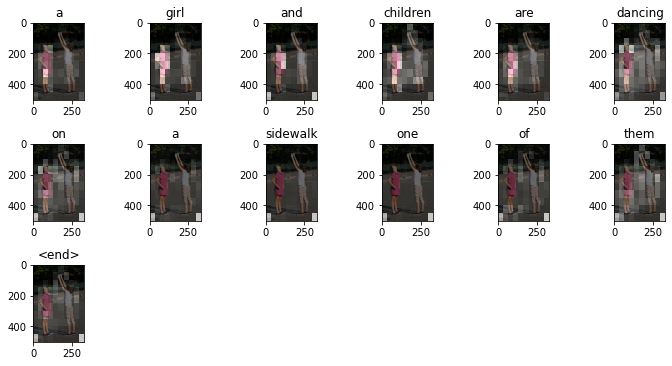

Real Caption: <start> two people holding hands running down a desert dune <end>
Real Caption: <start> a male and female are running down a sandy hill <end>
Real Caption: <start> two people begin to run down a sand bank <end>
Real Caption: <start> two children running down a sand hill <end>
Real Caption: <start> two kids running over a sand dune <end>
Prediction Caption: a man is showing off a bend of trees as arid region the sand next to sand <end>


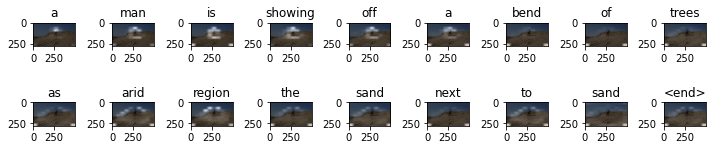

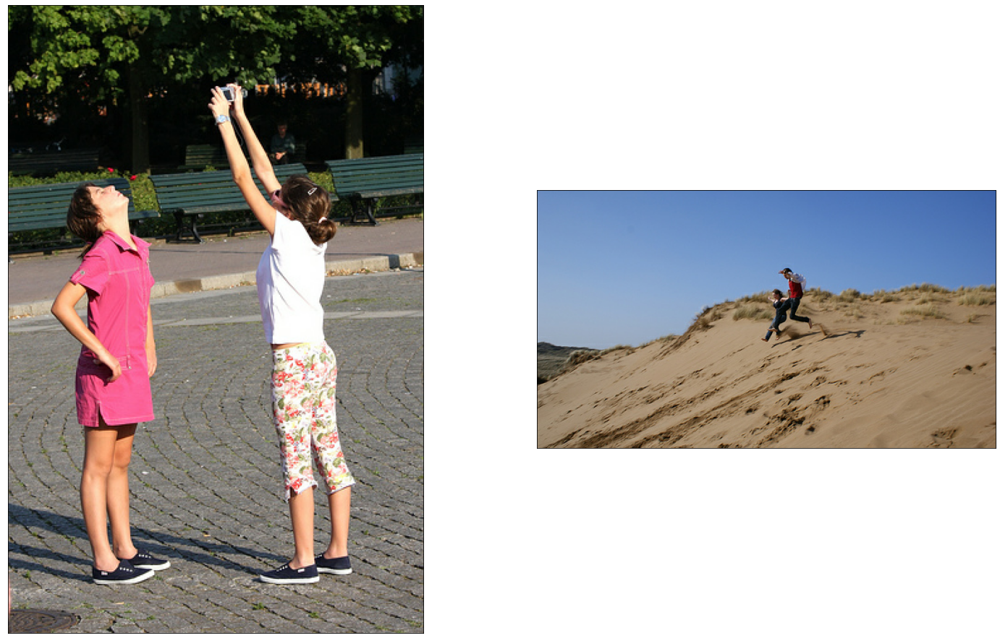

Real Caption: <start> a police officer on a horse stands in front of a red brick multistory building <end>
Real Caption: <start> a police woman riding on a brown horse next to a man in a black jacket <end>
Real Caption: <start> a man is talking to a mounted policeman outside a stadium <end>
Real Caption: <start> a policeman on a horse surrounded by onlookers <end>
Real Caption: <start> a man talks to a mounted policeman <end>
Prediction Caption: a man smoking a cop cop <end>


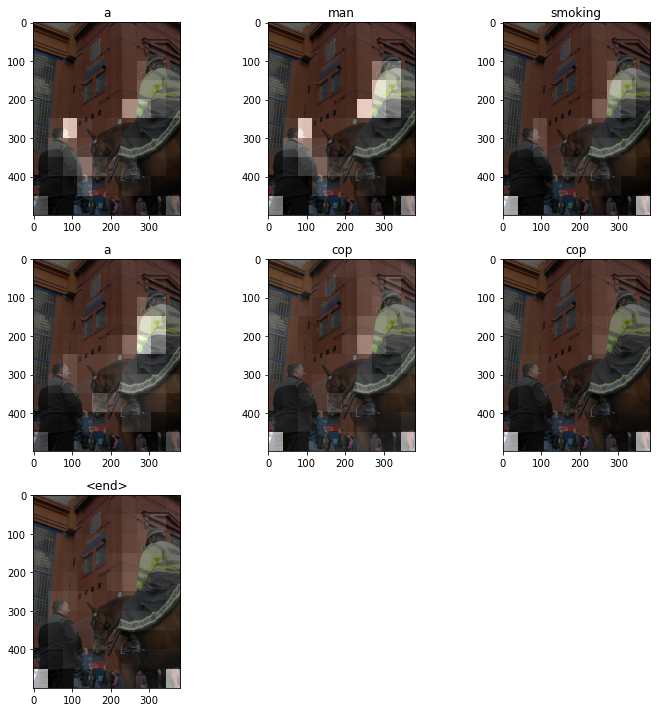

Real Caption: <start> a brown dog resting his head on the lap of a person who is eating some food <end>
Real Caption: <start> a brown dog looking at a plate with food someone 's hand taking from it <end>
Real Caption: <start> the brown dog with the red collar is staring at the plate of food <end>
Real Caption: <start> a dog 's head is in the lap of a person eating off a small plate <end>
Real Caption: <start> a brown dog is wanting food from a plate held by a person <end>
Prediction Caption: a dog with brown hair and holding a duck <end>


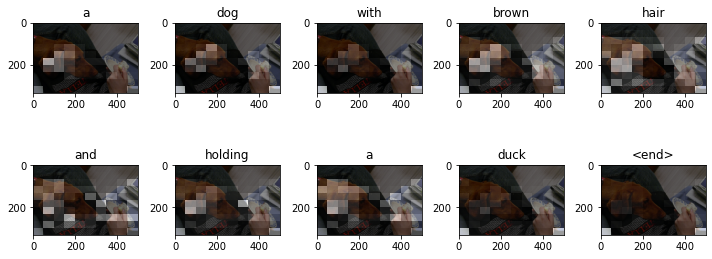

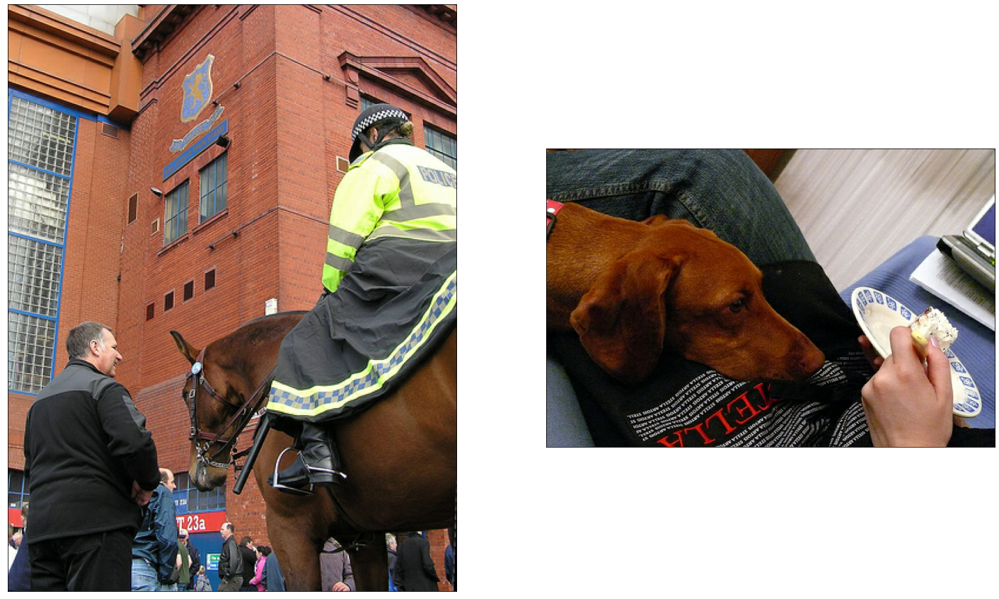

Real Caption: <start> three men are smiling while the man in front wears blue novelty bicycle sunglasses and a political t shirt <end>
Real Caption: <start> people wearing patterned t shirts celebrating some festivals with colorful eye wear <end>
Real Caption: <start> three young men are celebrating together in public <end>
Real Caption: <start> three drunk guys living it up in the city <end>
Real Caption: <start> a man is flipping someone off <end>
Prediction Caption: a lady looks like like the left <end>


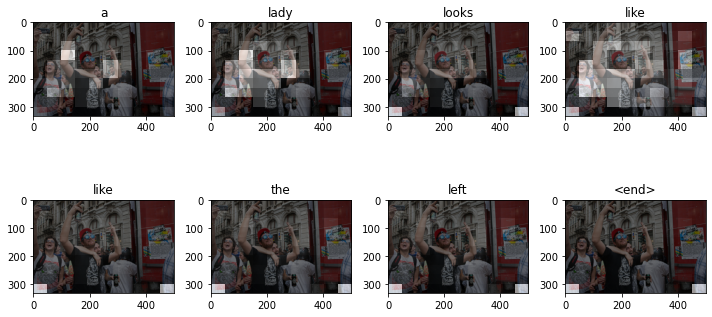

Real Caption: <start> two snowboarders are suspended in midair after a jump from a snow slope <end>
Real Caption: <start> two snowboarders in yellow and green are jumping in the air <end>
Real Caption: <start> two snowboarders are in the air over the snow <end>
Real Caption: <start> two snowboarders in the air above snow <end>
Real Caption: <start> two persons in midair snowboarding <end>
Prediction Caption: a snowboarder is doing a flip in midair whilst a shadow <end>


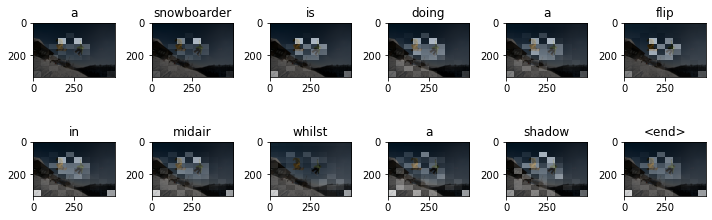

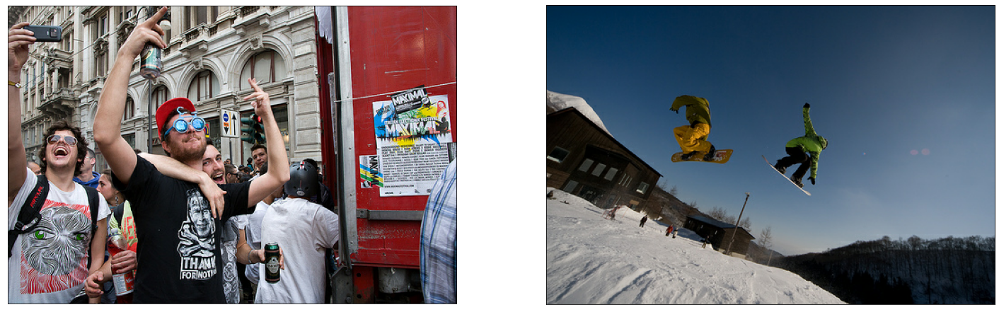

Real Caption: <start> a small boy plays with plastic blocks cars and animals with an adult watching closely <end>
Real Caption: <start> a young caucasian child and another adult lady are playing with a house made out of legos <end>
Real Caption: <start> young child and woman with glasses playing with toys on a red rug <end>
Real Caption: <start> a woman is playing toys with a young toddler sitting on a red mat <end>
Real Caption: <start> new mom plays with her young baby <end>
Prediction Caption: one woman made playing with a thomas toy train <end>


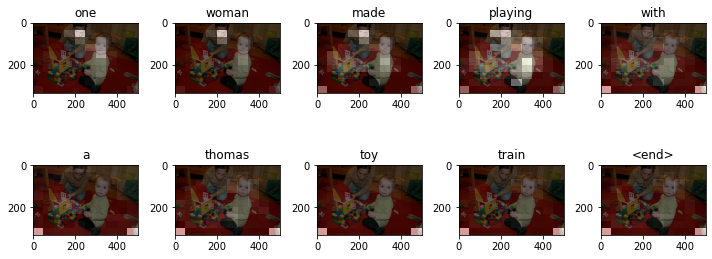

Real Caption: <start> a man uses two sticks to control two tan goats in a pen while a black and white dog watches <end>
Real Caption: <start> a cowboy stands near two sheep and a dog at a rodeo <end>
Real Caption: <start> a black and white dog is staring at two brown lambs <end>
Real Caption: <start> a man in a pink shirt herding goats in a ring <end>
Real Caption: <start> the dog is herding sheep into a pen <end>
Prediction Caption: a dog is watching a sheep <end>


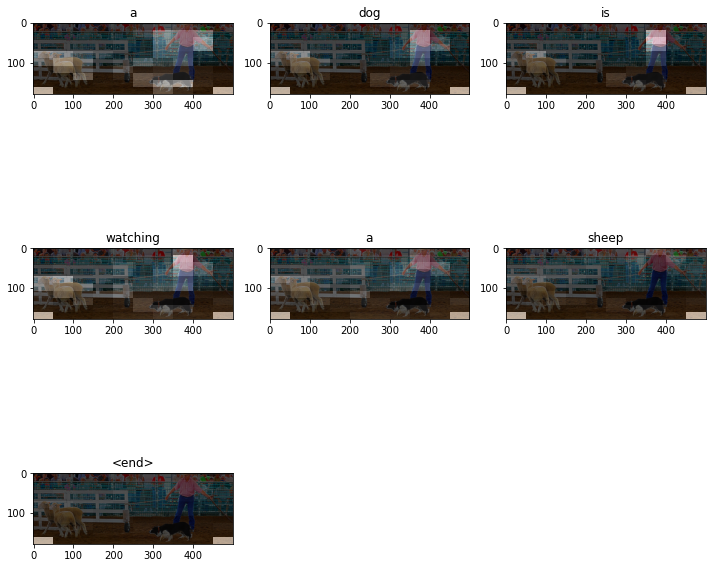

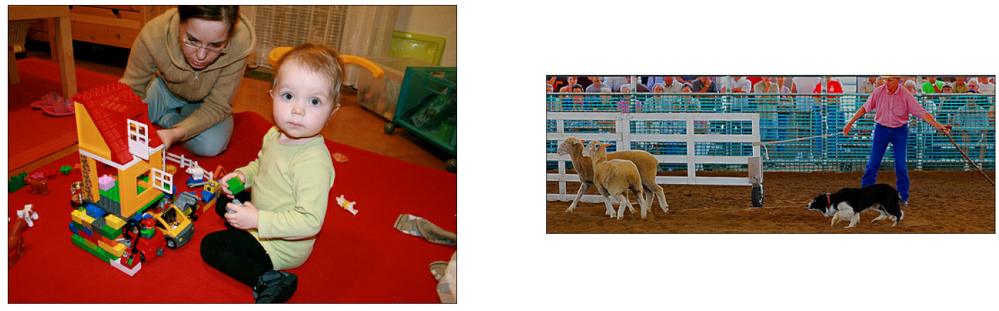

Real Caption: <start> a large group of smiling children dressed in green standing outside of a primary school <end>
Real Caption: <start> children gathered outside the abubakar umar memorial primary school <end>
Real Caption: <start> young african american children in green outfits clap in unison <end>
Real Caption: <start> children are praying before the beginning of school <end>
Real Caption: <start> these boys are at memorial primary school <end>
Prediction Caption: young adults religious fans in a circle <end>


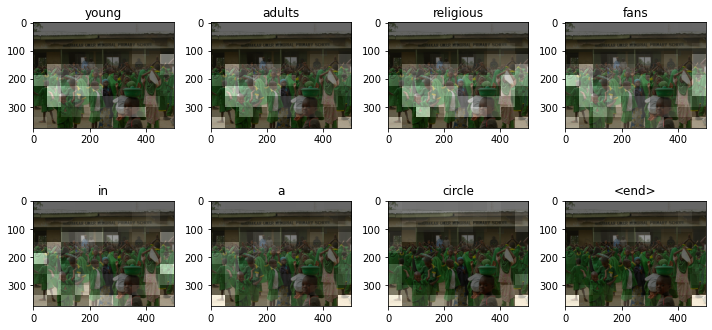

Real Caption: <start> a man with gray hair and a blond woman sitting on the same side of a table with bikes in the background <end>
Real Caption: <start> a gray haired man and a blond younger woman listen to someone speak to them at an outside cafe <end>
Real Caption: <start> a man and woman at a table the woman has a cup with drink in front of her <end>
Real Caption: <start> there 's a lady with her hands on her face and a guy sitting at a table <end>
Real Caption: <start> a woman in a red sweater is sitting next to a man at a table outside <end>
Prediction Caption: a man points questions <end>


ValueError: num must be 1 <= num <= 4, not 5

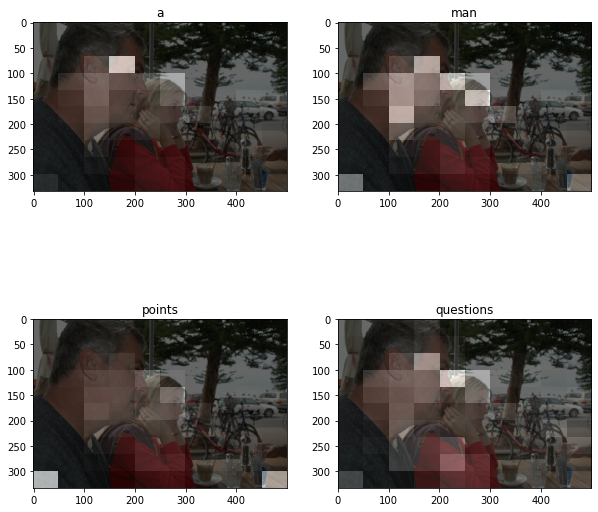

In [50]:
# captions on the train set
imgs = []
for ii in range(10):
    rid = np.random.randint(0, len(img_name_train))
    print_all_captions(img_name_train,cap_train,rid)
    image = img_name_train[rid]
    result, attention_plot = evaluate(image)
    print ('Prediction Caption:', ' '.join(result))
    img = plot_attention(image, result, attention_plot)
    imgs.append(img)
    if (ii+1) %2 == 0:
        show_Nimages(imgs)
        imgs = []

## 3.2 Prediction on Validation Set

The real test for our model is here. Is it able to generalize to unknown images ?
Let see it by yourself. Nevertheless, from the validation loss, we got, it seems that our model can explain each valid image as well as that of each training image.

Overall, if we run this prediction many times (each times with 10 random new images), we can see that roughly our model understand many images concept like "many people", "computer", "field", "dog", "girl", "mouth", etc. or even action like "leaning", "sitting", "jump". etc. However, it does not know the grammar so the sentence it produces many time look quite strange!

We may be able to fix this by sending this incomplete sentence to the sentence-expert like GPT-2 and make it correct for us!

Real Caption: <start> a man looking through a microscope and manipulating the contents of the slide <end>
Real Caption: <start> a man wearing a striped shirt operates a microscope in a laboratory <end>
Real Caption: <start> someone using a microscope is working on something really small <end>
Real Caption: <start> a man is covering a slide while looking through a microscope <end>
Real Caption: <start> a man in a striped shirt is using a microscope <end>
Prediction Caption: a man and a woman checking out into the desk desk <end>


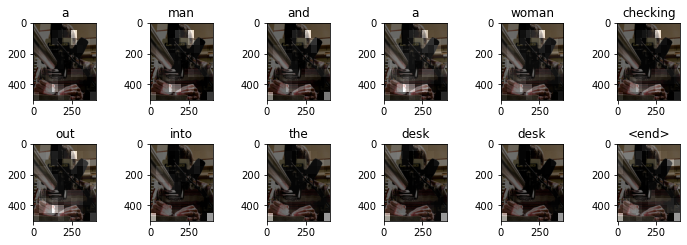

Real Caption: <start> a young child is covered in straw except for the head and left arm <end>
Real Caption: <start> a child lies in the hay with only a head and arm showing <end>
Real Caption: <start> the child is playing hide and seek in the hay <end>
Real Caption: <start> child playing and hiding underneath hay <end>
Real Caption: <start> girl hides in hay <end>
Prediction Caption: a little girl in a diaper in a flatbed on wood <end>


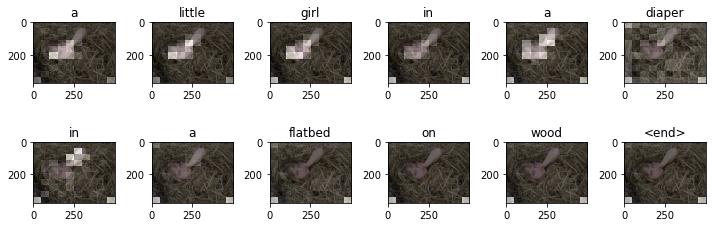

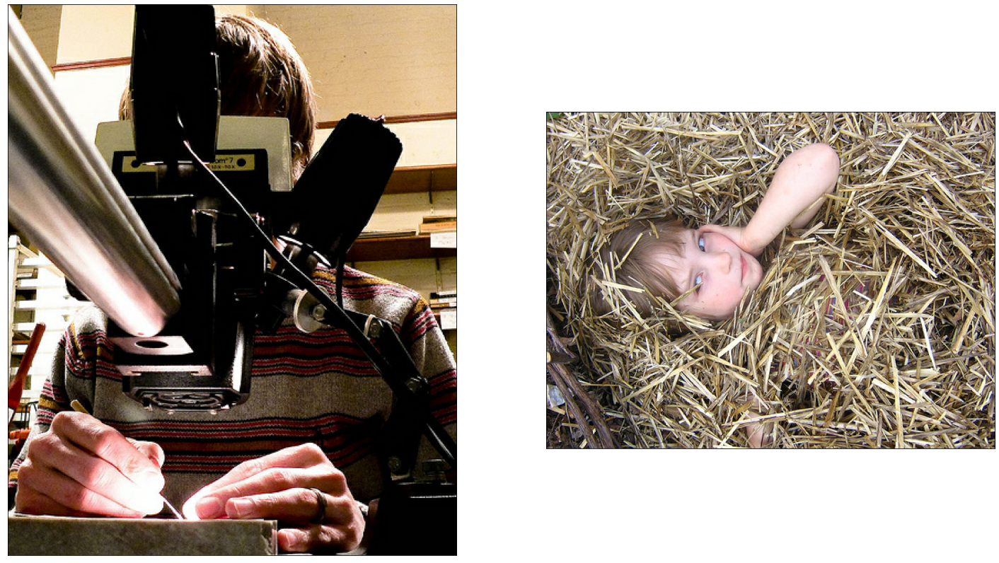

Real Caption: <start> a young child is covered in straw except for the head and left arm <end>
Real Caption: <start> a child lies in the hay with only a head and arm showing <end>
Real Caption: <start> the child is playing hide and seek in the hay <end>
Real Caption: <start> child playing and hiding underneath hay <end>
Real Caption: <start> girl hides in hay <end>
Prediction Caption: a little girl opens her eyes holds something out <end>


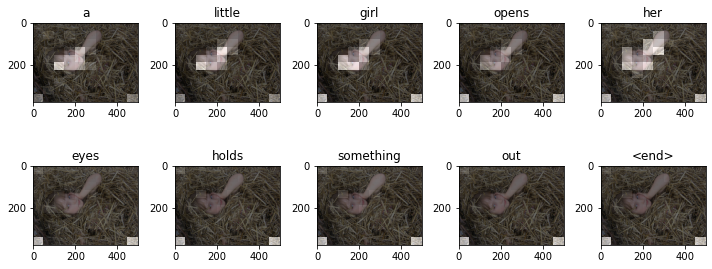

Real Caption: <start> a ribbon dancer is leaping through the air with her head back during a competition green ribbon behind her <end>
Real Caption: <start> a woman wearing a sparkly blue costume leaps into the air while swirling a green ribbon in her left hand <end>
Real Caption: <start> a creative dancer in a shiny blue leotard in mid flight is holding a green decorative streamer <end>
Real Caption: <start> the rhythmic gymnast completes her floor exercise at the competition <end>
Real Caption: <start> a gymnast dances around with a long ribbon during a performance <end>
Prediction Caption: a female figure gymnast wearing an orange leotard is moving at the bleachers <end>


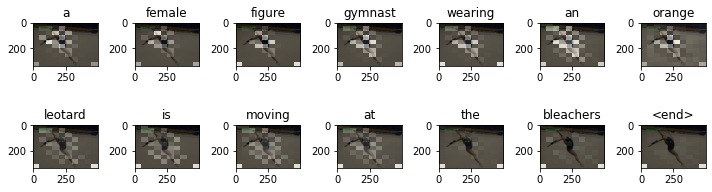

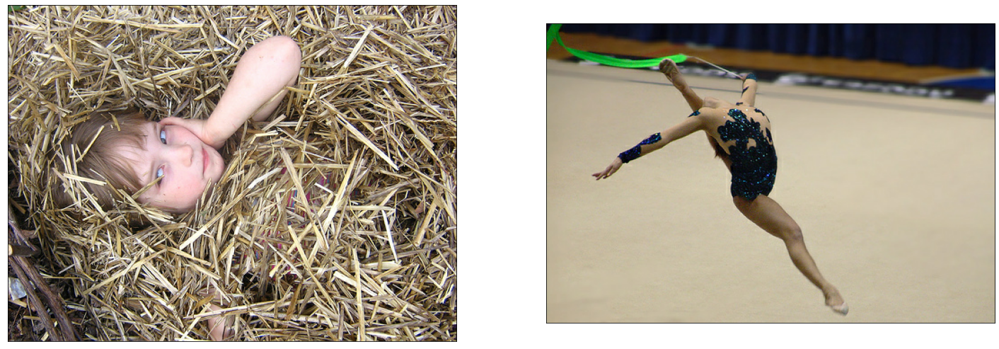

Real Caption: <start> the man in the black suit and hat is holding the hand of the girl in the green dress whilst looking away from each other <end>
Real Caption: <start> a well dressed young couple hold hands and pull in different directions in front of trees <end>
Real Caption: <start> a young boy wearing a suit and top hat is holding hands with a girl in a green dress <end>
Real Caption: <start> a man and a woman holding hands try to go their opposite ways <end>
Real Caption: <start> young couple in formal attire hold hands <end>
Prediction Caption: man with hair wearing a cowboy hat sits near a flowering tree <end>


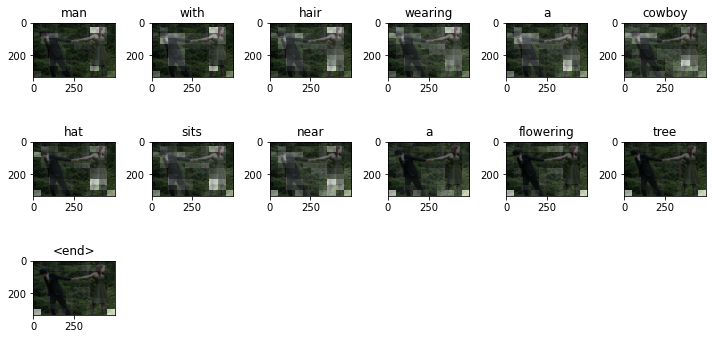

Real Caption: <start> some young men stand holding a railing with a lot of other people <end>
Real Caption: <start> three young men wearing hooded sweatshirts standing at a bench <end>
Real Caption: <start> a group of several people standing around a railing <end>
Real Caption: <start> a group of people are looking into the distance <end>
Real Caption: <start> a bunch of people mainly men watching something <end>
Prediction Caption: a group of people are sitting on a busy road <end>


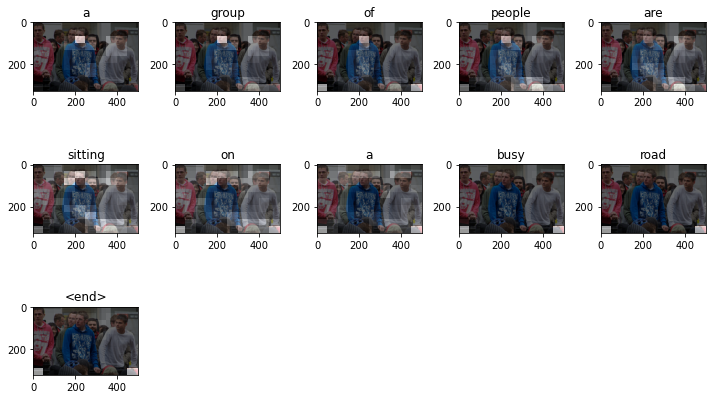

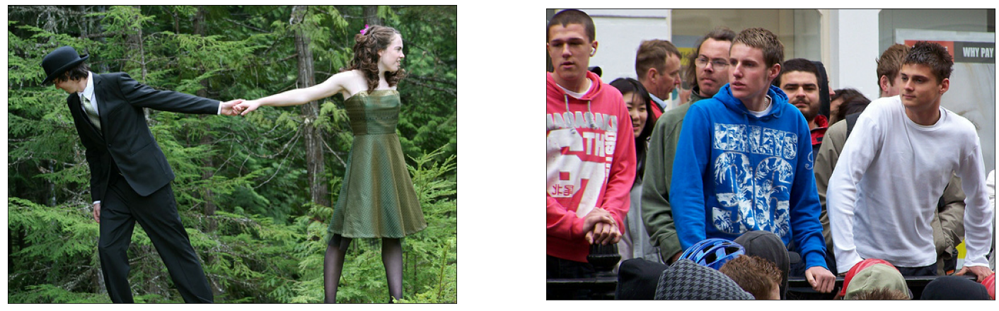

Real Caption: <start> a young boy is using a power tool to work on something while an older man helps him <end>
Real Caption: <start> a young boy and an older man are using a drill on some type of object <end>
Real Caption: <start> a teacher guides an attentive stupid on a woodworking project <end>
Real Caption: <start> a man showing a young buy how to use a drill <end>
Real Caption: <start> a man teaches a boy to use a drill <end>
Prediction Caption: a boy with face cutting wooden objects while a screwdriver operates a pen in a park table <end>


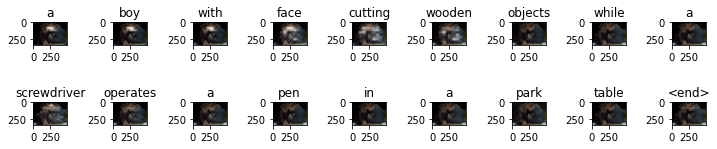

Real Caption: <start> people are sitting at tables and some are looking at a dog balloon <end>
Real Caption: <start> several people sitting outside around a dalmatian balloon <end>
Real Caption: <start> these people are sitting outside on a sunny day <end>
Real Caption: <start> people sit outside a tea house on a nice day <end>
Real Caption: <start> a group of people relaxing at some tables <end>
Prediction Caption: a group of people are sitting in a window <end>


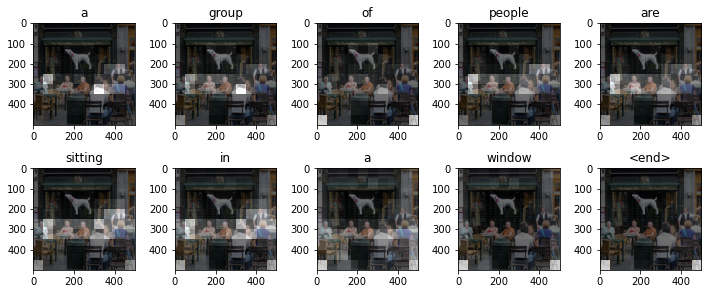

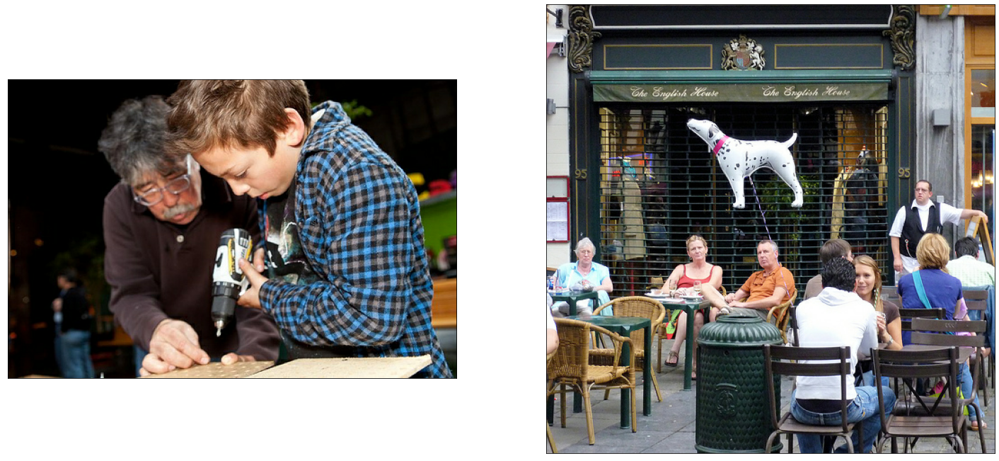

Real Caption: <start> two boys in a park one standing near a tree and one sitting at a picnic table with the playground behind them <end>
Real Caption: <start> a young boy in a striped shirt is leaning against a tree while another child sits at a picnic table <end>
Real Caption: <start> a boy in a striped t shirt is standing by a tree in front of the picnic tables <end>
Real Caption: <start> a little boy in a striped shirt is standing behind a tree <end>
Real Caption: <start> a boy hiding behind a tree <end>
Prediction Caption: a young boy stands on a pathway <end>


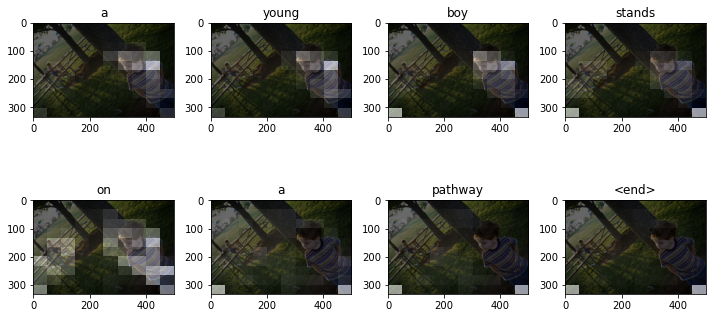

Real Caption: <start> a man wearing a white shirt and khaki pants passes in front of a snack stand <end>
Real Caption: <start> a man in a white shirt and white hat holding a brush and a bag in his hands <end>
Real Caption: <start> a man in a white shirt walking with a bag in his hand <end>
Real Caption: <start> two men are staring outside <end>
Real Caption: <start> man in white shirt walking <end>
Prediction Caption: a woman walking through a garage sign <end>


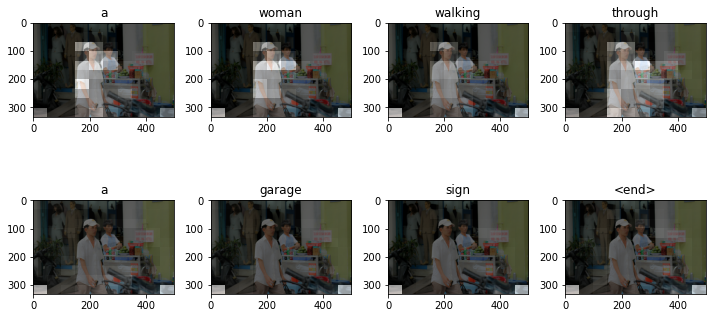

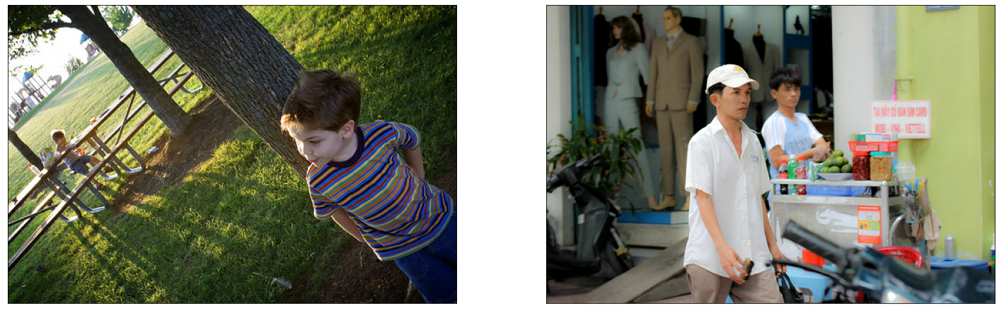

In [45]:
# captions on the validation set
imgs = []
for ii in range(10):
    rid = np.random.randint(0, len(img_name_val))
    print_all_captions(img_name_val,cap_val,rid)
    image = img_name_val[rid]
    result, attention_plot = evaluate(image)
    print ('Prediction Caption:', ' '.join(result))
    img = plot_attention(image, result, attention_plot)
    imgs.append(img)
    if (ii+1) %2 == 0:
        show_Nimages(imgs)
        imgs = []

In [46]:
# import gc
# del dataset
gc.collect()

92685

## 3.3 BONUS : Prepare all prediction caps for GPT2

As mentioned in the previous section, we may further be able to improve the syntactic quality of the captions by feeding these generated sentences into GPT2. Here as a bonus below codes will save the generated sentences into files to be trained by GPT-2. Actually, I also have this GPT-2 kernel, so if anyone read through this last section, and would like to see, please let me know!!

In [47]:
def gen_cap(image):
    attention_plot = np.zeros((max_length, attention_features_shape))
    hidden = decoder.reset_state(batch_size=1)
    img_tensor_val = tf.expand_dims(decode_image(image), 0)
    features = encoder(img_tensor_val)
    dec_input = tf.expand_dims([tokenizer.word_index['<start>']], 0)
    result = []

    for i in range(max_length):
        predictions, hidden, attention_weights = decoder(dec_input, features, hidden)
        predicted_id = tf.random.categorical(predictions, 1)[0][0].numpy()
        word = tokenizer.index_word.get(predicted_id, tokenizer.word_index['<end>'])
        result.append(word)
        if word == '<end>':
            return result

        dec_input = tf.expand_dims([predicted_id], 0)

    return result

In [48]:
len(img_name_train),len(img_name_val)
START = 120000
END = 150000

In [ ]:
# captions on the validation set
imgs = []
real_caps, pred_caps = [], []
for rid in tqdm_notebook(range(START, END)): # 100 captions / 1:05 >> 10000 caps / 110mins >> 30,000 / 330mins+30min(preparing) = 6hours
    image = img_name_train[rid]
    result = gen_cap(image)
    
    real_caps.append(' '.join([tokenizer.index_word[i] for i in cap_train[rid] if i not in [0]]))
    pred_caps.append(' '.join(result))

In [ ]:
# real_caps, pred_caps
np.savetxt('real_caps.txt', real_caps, fmt='%s')
np.savetxt('pred_caps.txt', pred_caps, fmt='%s')

In [ ]:
!cat real_caps.txt | head
!cat pred_caps.txt | head